# Capstone Project - Portland, Oregon's Bicycle Traffic
### Lisa Myers
### 11/14/2020

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

In this project I will try to determine if Portland, Oregon's neighborhoods can increase bicycle ridership.

This can be done by looking at the current:
* number of existing bicycle routes,
* number of existing bicycle parking areas,
* number of and distance to existing venues (which are appropriate for bicycle commuters), if any
* median house sale price for each Portland neighborhood

The physical proximity of the bicycle routes, shopping venues, parking areas, and affordable housing are important factors for increasing bicycle ridership.  In order for commuters to choose cycling over driving, the shopping venues need to be grouped together, routes to residency need to be short, and parking needs to be close to venues.    

## Data <a name="data"></a>

Following data sources will be used to extract/generate the required information:

* coordinate of **Portland** center will be obtained using **GeoPy API geocoding** of well known Portland, Or location

* Bicycle parking will be extracted from: <a href='https://gis-pdx.opendata.arcgis.com/datasets/e7c610f6b050406cb9fd40323c63c643_62?geometry=-122.693%2C45.516%2C-122.659%2C45.522'>PortlandMaps - Open Data</a> (Bicycle Parking), updated on 11/4/2020
... Downloaded Bicycle_Parking.kml file and used the pykml parser to read the data with 7618 records.

* Bicycle routes will be extracted from: <a href='https://gis-pdx.opendata.arcgis.com/datasets/recommended-bicycle-route-points?geometry=-123.759%2C45.367%2C-121.586%2C45.704'>PortlandMaps - Open Data</a> (Bicycle Routes), updated in 11/5/2020
... Downloaded Recommended_Bicycle_Route_Points.kml file and used the pykml parser to read the data with 554 records.

*  Median House Sale Price will be scraped from a web table: <a href='https://www.pdxmonthly.com/home-and-real-estate/2019/03/portland-neighborhoods-by-the-numbers-2019-the-city'>Portland Neighborhoods by the Numbers 2019: The City</a>
... Scraped web table of 96 records of Portland neighborhood data.

* number of venues and location in every neighborhood will be obtained using **Foursquare API**

In [2]:
import pandas as pd

#### 1. Retrieve Latitude and Longitude Data for Portland

In [5]:
#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim

In [13]:
address = 'Portland, Oregon'

geolocator = Nominatim(user_agent="or_explorer")
location = geolocator.geocode(address)
portland_latitude = location.latitude
portland_longitude = location.longitude
print('The geograpical coordinate of Portland are {}, {}.'.format(portland_latitude, portland_longitude))

The geograpical coordinate of Portland are 45.5202471, -122.6741949.


#### 2. Retrieve Parking data from PortlandMaps - Open Data

In [17]:
#!pip install pykml
from pykml import parser
import pandas as pd

filename='Bicycle_Parking.kml'
with open(filename) as f:
    folder = parser.parse(f).getroot().Document.Folder

plnm=[]
cordi=[]
for pm in folder.Placemark:
    plnm1=pm.ExtendedData.SchemaData.SimpleData[4]
    plcs1=pm.Point.coordinates
    plnm.append(plnm1.text)
    cordi.append(plcs1.text)
    
df_parking=pd.DataFrame()
df_parking['LocationID']=plnm
df_parking['cordinates']=cordi

**Cleanse the dataframe**

In [18]:
df_parking['Longitude'], df_parking['Latitude']= zip(*df_parking['cordinates'].apply(lambda x: x.split(',', 2)))
df_parking= df_parking.drop(['cordinates'], axis=1)
df_parking['Longitude'] = pd.to_numeric(df_parking['Longitude'])
df_parking['Latitude'] = pd.to_numeric(df_parking['Latitude'])

In [19]:
df_parking

,LocationID,Longitude,Latitude
0,BF27867,-122.698508,45.528724
1,BF27850,-122.698799,45.532351
2,BF27693,-122.690449,45.530498
3,BF27630,-122.690208,45.524029
4,BF18189,-122.651188,45.535129
...,...,...,...
7613,BF7832,-122.680240,45.554580
7614,BF7832,-122.680152,45.554579
7615,BF7832,-122.680122,45.554579
7616,BF7832,-122.680039,45.554580


#### Assign a Neighborhood, Address, and PostalCode using the **Routes** *Latitude and Longitude*, with a reverse call to GeoLocator, which will return the Location Information

In [9]:
## define the dataframe columns
column_names = ['LocationID', 'Address', 'Neighborhood', 'PostalCode', 'Latitude', 'Longitude'] 

## instantiate the dataframe
parking_hood = pd.DataFrame(columns=column_names)

In [10]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="or_explorer")
for lat, lng, df_id in zip(df_parking['Latitude'], df_parking['Longitude'], df_parking['LocationID']):
    location = geolocator.reverse((lat, lng))   
    try:
        data = location.raw
        data = data['address']
        addr = str(data)
        street = district = state = country = countryCode = ""
        if addr.find('suburb') > 0:
            neighborhood = str(data['suburb'])
        else:
            neighborhood = ""
        if addr.find('postcode') > 0:
            postalCode  =str(data['postcode'])
        else:
            postalCode = ""    
    finally:
        parking_hood = parking_hood.append({'LocationID': df_id,
                                          'Address': addr,
                                          'Neighborhood': neighborhood,
                                          'PostalCode': postalCode,
                                          'Latitude': lat,
                                          'Longitude': lng}, ignore_index=True)  

#### Normalize data by having all Neighborhoods be in uppercase.

In [12]:
parking_hood['Neighborhood'] = parking_hood['Neighborhood'].str.upper()
parking_hood

,LocationID,Address,Neighborhood,PostalCode,Latitude,Longitude
0,BF27867,"{'historic': 'Alphabet Historic District', 'ro...",NORTHWEST DISTRICT,97205,45.528724,-122.698508
1,BF27850,"{'building': 'Overton Park', 'house_number': '...",NORTHWEST DISTRICT,97210,45.532351,-122.698799
2,BF27693,"{'house_number': '1036', 'road': 'Northwest 19...",NORTHWEST DISTRICT,97209,45.530498,-122.690449
3,BF27630,"{'historic': 'Alphabet Historic District', 'ro...",NORTHWEST DISTRICT,97205,45.524029,-122.690208
4,BF18189,"{'house_number': '1411', 'road': 'Northeast Br...",LLOYD DISTRICT,97232,45.535129,-122.651188
...,...,...,...,...,...,...
7613,BF7832,"{'house_number': '1314', 'road': 'North Skidmo...",OVERLOOK,97217,45.554580,-122.680240
7614,BF7832,"{'house_number': '1314', 'road': 'North Skidmo...",OVERLOOK,97217,45.554579,-122.680152
7615,BF7832,"{'house_number': '1314', 'road': 'North Skidmo...",OVERLOOK,97217,45.554579,-122.680122
7616,BF7832,"{'house_number': '1314', 'road': 'North Skidmo...",OVERLOOK,97217,45.554580,-122.680039


#### Merging Neighborhood data and parking data took over 40 minutes...  saving dataframe in csv file for future use

In [13]:
#parking_hood.to_csv("PortlandParkingData.csv", index=False)

In [6]:
parking_hood= pd.read_csv("PortlandParkingData.csv")

#### 3. Retrieve Bicycle Routes data from PortlandMaps - Open Data

In [18]:
from pykml import parser
import pandas as pd

filename='Recommended_Bicycle_Route_Points.kml'
with open(filename) as f:
    folder = parser.parse(f).getroot().Document.Folder

plnm=[]
cordi=[]
for pm in folder.Placemark:
    plnm1=pm.ExtendedData.SchemaData.SimpleData[1]
    plcs1=pm.Point.coordinates
    plnm.append(plnm1.text)
    cordi.append(plcs1.text)
    
df_route=pd.DataFrame()
df_route['TranPlanID']=plnm
df_route['cordinates']=cordi

**Cleanse the dataframe**

In [19]:
df_route['Longitude'], df_route['Latitude']= zip(*df_route['cordinates'].apply(lambda x: x.split(',', 2)))
df_route= df_route.drop(['cordinates'], axis=1)
df_route['Longitude'] = pd.to_numeric(df_route['Longitude'])
df_route['Latitude'] = pd.to_numeric(df_route['Latitude'])
df_route

,TranPlanID,Longitude,Latitude
0,TP08-0000003,-122.531959,45.567751
1,TP08-0000006,-122.561383,45.559769
2,TP08-0000013,-122.557813,45.551894
3,TP08-0000035,-122.542253,45.526293
4,TP08-0000041,-122.501512,45.526440
...,...,...,...
548,TP08-0001093,-122.681711,45.554843
549,TP08-0001094,-122.587214,45.526629
550,TP08-0001095,-122.654929,45.506197
551,TP08-0001098,-122.650812,45.457830


#### Assign a Neighborhood, Address, and PostalCode using the **Routes** *Latitude and Longitude*, with a reverse call to GeoLocator, which will return the Location Information

In [20]:
## define the dataframe columns
column_names = ['TranPlanID', 'Address', 'Neighborhood', 'PostalCode', 'Latitude', 'Longitude'] 

## instantiate the dataframe
routes_hood = pd.DataFrame(columns=column_names)

In [21]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="or_explorer")
for lat, lng, df_id in zip(df_route['Latitude'], df_route['Longitude'], df_route['TranPlanID']):
    location = geolocator.reverse((lat, lng))   
    try:
        data = location.raw
        data = data['address']
        addr = str(data)
        street = district = state = country = countryCode = ""
        if addr.find('suburb') > 0:
            neighborhood = str(data['suburb'])
        else:
            neighborhood = ""
        if addr.find('postcode') > 0:
            postalCode  =str(data['postcode'])
        else:
            postalCode = ""    
    finally:
        routes_hood = routes_hood.append({'TranPlanID': df_id,
                                          'Address': addr,
                                          'Neighborhood': neighborhood,
                                          'PostalCode': postalCode,
                                          'Latitude': lat,
                                          'Longitude': lng}, ignore_index=True)  

In [22]:
routes_hood

,TranPlanID,Address,Neighborhood,PostalCode,Latitude,Longitude
0,TP08-0000003,"{'house_number': '13227', 'road': 'Northeast M...",Parkrose,97230,45.567751,-122.531959
1,TP08-0000006,"{'road': 'Northeast Killingsworth Street', 'su...",Parkrose,97220,45.559769,-122.561383
2,TP08-0000013,"{'house_number': '4004', 'road': 'Northeast 10...",Parkrose,97220,45.551894,-122.557813
3,TP08-0000035,"{'house_number': '11704', 'road': 'Northeast G...",Hazelwood,97220,45.526293,-122.542253
4,TP08-0000041,"{'house_number': '15631', 'road': 'Northeast G...",Glenfair,97230,45.526440,-122.501512
...,...,...,...,...,...,...
548,TP08-0001093,{'shop': 'Golden Pliers Bicycle Repair & Suppl...,Overlook,97217,45.554843,-122.681711
549,TP08-0001094,"{'house_number': '7305', 'road': 'Northeast Gl...",North Tabor,97213,45.526629,-122.587214
550,TP08-0001095,"{'house_number': '2315', 'road': 'Southeast 11...",Hosford-Abernethy,97214,45.506197,-122.654929
551,TP08-0001098,"{'house_number': '592', 'road': 'Southeast And...",Waverly Heights,97202,45.457830,-122.650812


#### Remove rows that do not have an associated Neighborhood

In [23]:
routes_hood.drop(routes_hood[routes_hood['Neighborhood'] == ""].index, inplace = True) 
routes_hood['Neighborhood'] = routes_hood['Neighborhood'].str.upper()
routes_hood

,TranPlanID,Address,Neighborhood,PostalCode,Latitude,Longitude
0,TP08-0000003,"{'house_number': '13227', 'road': 'Northeast M...",PARKROSE,97230,45.567751,-122.531959
1,TP08-0000006,"{'road': 'Northeast Killingsworth Street', 'su...",PARKROSE,97220,45.559769,-122.561383
2,TP08-0000013,"{'house_number': '4004', 'road': 'Northeast 10...",PARKROSE,97220,45.551894,-122.557813
3,TP08-0000035,"{'house_number': '11704', 'road': 'Northeast G...",HAZELWOOD,97220,45.526293,-122.542253
4,TP08-0000041,"{'house_number': '15631', 'road': 'Northeast G...",GLENFAIR,97230,45.526440,-122.501512
...,...,...,...,...,...,...
548,TP08-0001093,{'shop': 'Golden Pliers Bicycle Repair & Suppl...,OVERLOOK,97217,45.554843,-122.681711
549,TP08-0001094,"{'house_number': '7305', 'road': 'Northeast Gl...",NORTH TABOR,97213,45.526629,-122.587214
550,TP08-0001095,"{'house_number': '2315', 'road': 'Southeast 11...",HOSFORD-ABERNETHY,97214,45.506197,-122.654929
551,TP08-0001098,"{'house_number': '592', 'road': 'Southeast And...",WAVERLY HEIGHTS,97202,45.457830,-122.650812


#### Merging Neighborhood data and parking data took over 40 minutes...  saving dataframe in csv file for future use

In [107]:
#routes_hood.to_csv("PortlandRouteData.csv", index=False)

In [7]:
routes_hood = pd.read_csv("PortlandRouteData.csv")

### 4. Web Scraping HTML Table for Median House Sale Price Data for the Portland, Oregon area.

In [18]:
import requests
import lxml.html as lh
url='https://www.pdxmonthly.com/home-and-real-estate/2019/03/portland-neighborhoods-by-the-numbers-2019-the-city'
#Create a handle, page, to handle the contents of the website
page = requests.get(url)
#Store the contents of the website under doc
doc = lh.fromstring(page.content)
#Parse data that are stored between <tr>..</tr> of HTML
tr_elements = doc.xpath('//tr')

In [19]:
tr_elements = doc.xpath('//tr')
#Create empty list
col=[]
i=0
#For each row, store each first element (header) and an empty list
for t in tr_elements[0]:
    i+=1
    name=t.text_content()
    col.append((name,[]))

In [20]:
#Since out first row is the header, data is stored on the second row onwards
for j in range(1,len(tr_elements)):
    #T is our j'th row
    T=tr_elements[j]
    
    #If row is not of size 10, the //tr data is not from our table 
   # if len(T)!=10:
       # break
    
    #i is the index of our column
    i=0
    
    #Iterate through each element of the row
    for t in T.iterchildren():
        data=t.text_content() 
        #Check if row is empty
        if i>0:
        #Convert any numerical value to integers
            try:
                data=int(data)
            except:
                pass
        #Append the data to the empty list of the i'th column
        col[i][1].append(data)
        #Increment i for the next column
        i+=1

In [21]:
Dict={title:column for (title,column) in col}
df=pd.DataFrame(Dict)

In [22]:
df.head()

,Neighborhood,Average home sale price ($),Median home sale price ($),Average cost per square foot ($),Days on market (avg.),Homes sold in 2018 (#),Condo sales (%),1-year median price change (2017â2018) (%),5-year median price change (2014â2018) (%),Distressed property sales (%),...,Commute by public transit (%),Commute by bike (%),Commute by walking (%),Commute by biking and walking (%),Number of Max/streetcar/tram lines,Number of TriMet bus lines,Number of transit lines (bus/MAX/streetcar/tram),"Miles of bike routes (lanes, boulevards, multiuse paths)",Miles of bike routes (all) per square mile,Walk score
0,ALAMEDA,"785,713","738,000",268,31,81,0%,8%,26%,1%,...,8.8,3.9,11,14.9,0,3,3,1,1.2,65
1,ARBOR LODGE,"465,743","459,450",252,28,132,13%,1%,33%,0%,...,14.2,3.6,11.9,15.6,1,4,5,6,7.2,72
2,ARDENWALD-JOHNSON CREEK,"418,640","434,500",185,89,10,0%,-7%,34%,10%,...,9.3,0.4,7.3,7.7,1,5,6,3,7.8,54
3,ARGAY,"391,146","399,750",168,26,79,5%,11%,52%,0%,...,8.6,15.8,0.3,16.1,0,5,5,6,2.9,45
4,ARLINGTON HEIGHTS,"1,012,913","862,500",306,49,20,0%,-6%,9%,0%,...,6,10.6,4.1,14.8,2,4,6,1,1.6,40


#### Create new dataframe with needed features

In [71]:
#df_sales = pd.DataFrame(columns=df[('Neighborhood','Average home sale price ($)')])  
df_sales = df.filter(['Neighborhood','Average home sale price ($)', 'Median home sale price ($)', 'Average cost per square foot ($)', 
                      'Median age', 'Median household income ($)', 'Parks and natural areas (Acres)', 'Commute by bike (%)'
                      'Miles of bike routes (lanes, boulevards, multiuse paths)', 'Miles of bike routes (all) per square mile'], axis=1)

#### Verify all rows have a neighborhood value

In [204]:
df_sales.loc[df_sales['Neighborhood'] == ""]

,Neighborhood,Average home sale price ($),Median home sale price ($),Average cost per square foot ($),Median age,Median household income ($),Parks and natural areas (Acres),Miles of bike routes (all) per square mile


#### Save cleansed housing data

In [8]:
#df_sales.to_csv("PortlandHousingData.csv", index=False)
df_sales = pd.read_csv("PortlandHousingData.csv")
#df_sales.loc[df_sales.Neighborhood == 'PEARL', 'Neighborhood'] ='PEARL DISTRICT'

#### Build the Neighborhood dataframe by merging the Route, Parking, and Housing count dataframes together; 

In [341]:
route_grp = routes_hood.groupby('Neighborhood').count()
route_grp = route_grp.filter(['Neighborhood', 'TranPlanID'], axis=1)
route_grp = route_grp.rename(columns={"TranPlanID": "Route Count"})
route_cor = routes_hood.filter(['Neighborhood', 'Latitude', 'Longitude'], axis=1)

In [342]:
parking_grp = parking_hood.groupby('Neighborhood').count()
parking_grp = parking_grp.filter(['Neighborhood', 'Latitude'], axis=1)
parking_grp = parking_grp.rename(columns={"Latitude": "Parking Count"})

In [343]:
venues_grp = venues_hood.groupby('Neighborhood').count()
venues_grp = venues_grp.filter(['Neighborhood', 'Latitude'], axis=1)
venues_grp = venues_grp.rename(columns={"Latitude": "Venue Count"})

In [344]:
sales_grp = df_sales.filter(['Neighborhood', 'Median home sale price ($)'], axis=1)

In [345]:
df_result = routes_hood.groupby('Neighborhood', as_index=False)[('Latitude', 'Longitude')].mean()
df_result = pd.merge(df_result, route_grp, on='Neighborhood', how="outer")
df_result = pd.merge(df_result, parking_grp, on='Neighborhood', how="outer")
df_result = pd.merge(df_result, sales_grp, on='Neighborhood', how="outer")
df_result = df_result.fillna(0)
index_names = df_result[ df_result['Latitude'] == 0 ].index 
df_result.drop(index_names, inplace = True)
index_names = df_result[ df_result['Median home sale price ($)'] == 0 ].index 
df_result.drop(index_names, inplace = True)
index_names = df_result[ df_result['Neighborhood'] == 'SUNDERLAND' ].index 
df_result.drop(index_names, inplace = True)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


#### Sorted result to verify Neighborhood names matched in both Housing data and Bicycle Route data  -- cleaned data so Neighborhood could be used as index

In [247]:
#pd.set_option('display.max_rows', df_result.shape[0]+1)
#df_result.sort_values(by=['Neighborhood'])
#df_sales.loc[df_sales.Neighborhood == 'PEARL', 'Neighborhood'] ='PEARL DISTRICT'

### 5.  Setup FourSquare API used to find Portland Venues

#### Find how many venues are near each neighborhood

In [36]:
## define the dataframe columns
column_names = ['name', 'categories', 'lat', 'lng', 'Neighborhood'] 
portland_venues = pd.DataFrame(columns=column_names)
column_names = ['Neighborhood', 'Venue Count'] 
df_venueCnt = pd.DataFrame(columns=column_names)

In [37]:
CLIENT_ID = 'XJO4ZMMKGCFUFEHTQKW00T0C5FHC5YY5A1BCGDYSRCDQVD2W' # your Foursquare ID
CLIENT_SECRET = 'YCEXKQPWMK2W5OYE0W5EWZPKBQPXJXCQUB1GDF2BTB2G1ZHN' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquaredd API limit value

In [38]:
# function from FOURSQUARE that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### For each **Neighborhood** in the result dataframe; get the default first 100 venues (2 miles radius within neighborhood) from **FourSquare**

In [41]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

radius = 3218.69 # define radius = two miles

for lat, lng, hood in zip(df_result['Latitude'], df_result['Longitude'], df_result['Neighborhood']):
    # create URL
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        lat, 
        lng, 
        radius, 
        LIMIT)
    results = requests.get(url).json()
    
    venues = results['response']['groups'][0]['items']
    nearby_venues = json_normalize(venues) # flatten JSON

    # filter columns
    filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
    nearby_venues =nearby_venues.loc[:, filtered_columns]

    # filter the category for each row
    nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

    # clean columns
    nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

    # append current neighborhood's venues to the main dataframe
    #
    new_row = {'Neighborhood':hood, 'Venue Count':results['response']['totalResults']}
    df_venueCnt = df_venueCnt.append(new_row, ignore_index=True)
    
    nearby_venues['Neighborhood'] = hood
    portland_venues = portland_venues.append(nearby_venues)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:19: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


#### Cleansed the data

In [178]:
#df_result = pd.merge(df_result, df_venueCnt, on='Neighborhood', how="outer")
df_result = df_result.rename(columns={"Median Home Price" : "MedianHomePrice"})

In [105]:
#df_result.to_csv("PortlandNeighborhoodData.csv", index=False)

In [26]:
df_result = pd.read_csv("PortlandNeighborhoodData.csv")
df_result = df_result.rename(columns={"Median home sale price ($)" : "MedianHomePrice"})
#df_result['MedianHomePrice']=df_result['MedianHomePrice'].str.replace(',','')
#df_result

# Methodoloy

#### Load libraries for visualization analysis

In [10]:
import numpy as np # library to handle data in a vectorized manner

#import requests # library to handle requests
#from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library


#### I re-ran the dataset filters three times and plotted the map with neighborhoods located from the result dataset
**The anaylsis resulted with affordable housing only located on the outskirt neighborhoods**

In [11]:
#df_result = df_result.loc[df_result['Venue Count'] > 200]
#df_result = df_result.loc[df_result['MedianHomePrice'] <= 330000]
#df_result = df_result.loc[df_result['Route Count'] >200]

In [14]:
# create map of Portland using latitude and longitude values
map_portland = folium.Map([portland_latitude, portland_longitude], zoom_start=11)

# add markers to map
for lat, lng, hood, sale, venue, route, parking in zip(df_result['Latitude'], df_result['Longitude'], df_result['Neighborhood'], df_result['MedianHomePrice'],
                                                       df_result['Venue Count'], df_result['Route Count'], df_result['Parking Count']):
    label = '{}: Home Price= {}: Venues= {}: Bike Routes= {}: Bike Parking= {}'.format(hood, sale, venue, route, parking)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#BFFF00',
        fill_opacity=0.7,
        parse_html=False).add_to(map_portland)  

map_portland

In [20]:
# create map of Portland using latitude and longitude values
map_portland = folium.Map([portland_latitude, portland_longitude], zoom_start=11)

# add markers to map
for lat, lng, loc in zip(df_parking['Latitude'], df_parking['Longitude'], df_parking['LocationID']):
    label = '{}'.format(loc)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_portland)  

map_portland

### Display Portland Map with Parking points

In [21]:
# create map of Portland using latitude and longitude values
map_portland = folium.Map([portland_latitude, portland_longitude], zoom_start=11)

# add markers to map
for lat, lng, loc in zip(routes_hood['Latitude'], routes_hood['Longitude'], routes_hood['TranPlanID']):
    label = '{}'.format(loc)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='gold',
        fill=True,
        fill_color='#FFA500',
        fill_opacity=0.7,
        parse_html=False).add_to(map_portland)  

map_portland

### Bar Chart  - Charts number of venues per neighborhood, with the route count superimposed on the venue count

#### Need to order the result dataset, so the bar chart is easier to read

In [27]:
df_venue = df_result.sort_values(by=['Venue Count'])

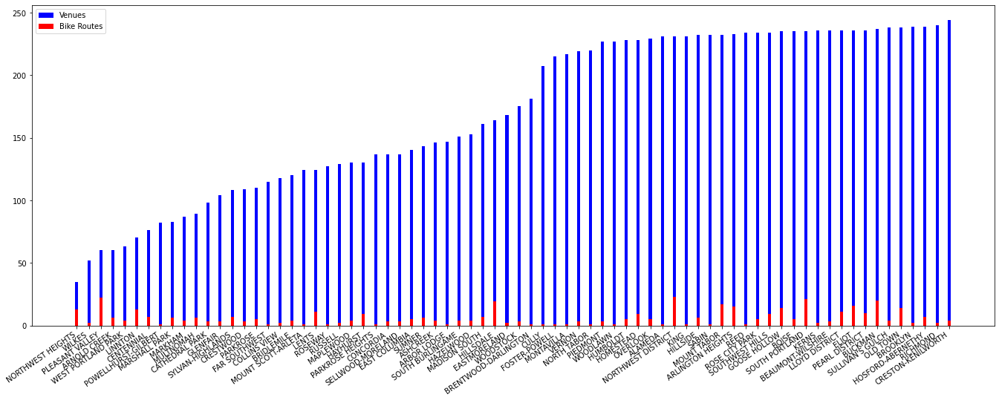

In [29]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 10})
fig = plt.figure(figsize=(18,6))
ax = fig.add_axes([0,0,1,1])
ax.bar(df_venue['Neighborhood'],df_venue['Venue Count'],color = 'b', width = 0.25)
ax.bar(df_venue['Neighborhood'],df_venue['Route Count'],color = 'r', width = 0.25)
ax.legend(labels=['Venues', 'Bike Routes', "Bike Parking"])
plt.xticks(rotation=35, ha='right')
plt.show()

# Regression Plots

#### Linear regression graph to show if venue count has an impact on route count

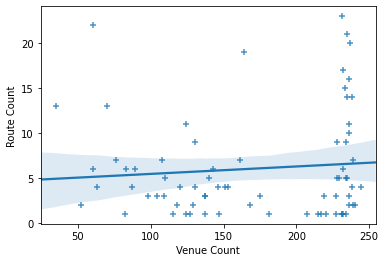

In [61]:
import seaborn as sns

ax = sns.regplot(x=df_result['Venue Count'], y=df_result['Route Count'], marker="+")

#### Linear regression graph to show if venue count has an impact on parking count

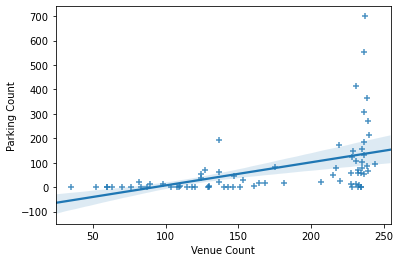

In [62]:
ax = sns.regplot(x=df_result['Venue Count'], y=df_result['Parking Count'], marker="+")

## Hot Encoding

#### Use venues as categorical variables

In [43]:
# one hot encoding
portland_onehot = pd.get_dummies(portland_venues[['categories']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
portland_onehot['Neighborhood'] = portland_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [portland_onehot.columns[-1]] + list(portland_onehot.columns[:-1])
portland_onehot = portland_onehot[fixed_columns]

portland_onehot.head()

,Zoo Exhibit,ATM,Accessories Store,Airport,Airport Service,American Restaurant,Amphitheater,Andhra Restaurant,Antique Shop,Arcade,...,Video Store,Vietnamese Restaurant,Warehouse Store,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
portland_grouped = portland_onehot.groupby('Neighborhood').mean().reset_index()

In [45]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Create list of the top 5 venues for each neighborhood, showing each venues frequency

In [46]:
num_top_venues = 5

for hood in portland_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = portland_grouped[portland_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ALAMEDA----
           venue  freq
0    Coffee Shop  0.07
1            Bar  0.06
2  Grocery Store  0.05
3    Pizza Place  0.04
4           Café  0.04


----ARBOR LODGE----
         venue  freq
0  Coffee Shop  0.09
1          Bar  0.08
2         Park  0.07
3   Food Truck  0.05
4  Pizza Place  0.04


----ARLINGTON HEIGHTS----
           venue  freq
0           Park  0.09
1    Coffee Shop  0.07
2        Brewery  0.04
3      Bookstore  0.04
4  Grocery Store  0.04


----ARNOLD CREEK----
               venue  freq
0         Sports Bar  0.05
1      Grocery Store  0.05
2        Pizza Place  0.03
3               Café  0.03
4  Convenience Store  0.03


----ASHCREEK----
         venue  freq
0  Coffee Shop  0.09
1          Bar  0.05
2  Pizza Place  0.04
3   Sports Bar  0.04
4      Brewery  0.03


----BEAUMONT-WILSHIRE----
          venue  freq
0   Coffee Shop  0.08
1           Bar  0.05
2   Pizza Place  0.04
3  Cocktail Bar  0.04
4          Park  0.04


----BOISE----
         venue  freq
0  Co

#### Create dataset with top 10 venues for each neighborhood

In [47]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))
# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = portland_grouped['Neighborhood']

for ind in np.arange(portland_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(portland_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALAMEDA,Coffee Shop,Bar,Grocery Store,Café,Pizza Place,Bakery,Park,Pet Store,Thai Restaurant,Food Truck
1,ARBOR LODGE,Coffee Shop,Bar,Park,Food Truck,Pizza Place,Cocktail Bar,Pet Store,Beer Store,Taco Place,Thai Restaurant
2,ARLINGTON HEIGHTS,Park,Coffee Shop,Bookstore,Brewery,Grocery Store,Garden,Pizza Place,Italian Restaurant,Café,Pub
3,ARNOLD CREEK,Grocery Store,Sports Bar,Pizza Place,Bar,Convenience Store,Park,Coffee Shop,Café,Burger Joint,Breakfast Spot
4,ASHCREEK,Coffee Shop,Bar,Pizza Place,Sports Bar,Thai Restaurant,Grocery Store,Ice Cream Shop,Mexican Restaurant,Park,Brewery


Run the KMeans Model with the portland group clustering

In [48]:
# set number of clusters
kclusters = 4

portland_grouped_clustering = portland_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(portland_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 1, 3, 2, 2, 1, 1, 1, 2, 1, 3, 2, 2, 2, 1, 1, 2, 1, 2, 1, 3, 2,
       1, 2, 3, 2, 2, 2, 3, 3, 1, 1, 3, 1, 2, 2, 3, 2, 2, 2, 2, 1, 1, 1,
       2, 1, 3, 0, 3, 1, 3, 2, 3, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 3, 3,
       1, 2, 2, 1, 2, 2, 1, 1], dtype=int32)

In [49]:
portland_data = df_result
print(portland_data.shape)
portland_data.head(10)

(74, 7)


,Neighborhood,Latitude,Longitude,Route Count,Parking Count,MedianHomePrice,Venue Count
0,ALAMEDA,45.549715,-122.637829,1.0,14.0,738000,231
1,ARBOR LODGE,45.576960,-122.689652,1.0,44.0,459450,147
2,ARLINGTON HEIGHTS,45.517047,-122.711445,15.0,8.0,862500,233
3,ARNOLD CREEK,45.444224,-122.701538,6.0,0.0,680000,60
4,ASHCREEK,45.459642,-122.740055,4.0,0.0,455000,146
5,BEAUMONT-WILSHIRE,45.550077,-122.624243,3.0,52.0,651000,236
6,BOISE,45.550183,-122.670490,5.0,157.0,508500,235
7,BRENTWOOD-DARLINGTON,45.465536,-122.610011,1.0,16.0,330000,181
8,BRIDLEMILE,45.489826,-122.722820,4.0,0.0,658500,120
9,BROOKLYN,45.498905,-122.650428,2.0,67.0,492450,239


#### Merge Portland dataset with the top 10 venue dataset, while adding the cluster label (for mapping)

In [51]:
# add clustering labels
neighborhoods_venues_sorted.insert(1, 'Cluster Labels', kmeans.labels_)

portland_merged = portland_data

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
portland_merged = portland_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

portland_merged.head() # check the last columns!
portland_merged['Cluster Labels'] = portland_merged['Cluster Labels'].astype(int)

In [52]:
portland_merged.head()

,Neighborhood,Latitude,Longitude,Route Count,Parking Count,MedianHomePrice,Venue Count,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALAMEDA,45.549715,-122.637829,1.0,14.0,738000,231,1,Coffee Shop,Bar,Grocery Store,Café,Pizza Place,Bakery,Park,Pet Store,Thai Restaurant,Food Truck
1,ARBOR LODGE,45.576960,-122.689652,1.0,44.0,459450,147,1,Coffee Shop,Bar,Park,Food Truck,Pizza Place,Cocktail Bar,Pet Store,Beer Store,Taco Place,Thai Restaurant
2,ARLINGTON HEIGHTS,45.517047,-122.711445,15.0,8.0,862500,233,3,Park,Coffee Shop,Bookstore,Brewery,Grocery Store,Garden,Pizza Place,Italian Restaurant,Café,Pub
3,ARNOLD CREEK,45.444224,-122.701538,6.0,0.0,680000,60,2,Grocery Store,Sports Bar,Pizza Place,Bar,Convenience Store,Park,Coffee Shop,Café,Burger Joint,Breakfast Spot
4,ASHCREEK,45.459642,-122.740055,4.0,0.0,455000,146,2,Coffee Shop,Bar,Pizza Place,Sports Bar,Thai Restaurant,Grocery Store,Ice Cream Shop,Mexican Restaurant,Park,Brewery


In [53]:
# create map
map_clusters = folium.Map([portland_latitude, portland_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(portland_merged['Latitude'], portland_merged['Longitude'], portland_merged['Neighborhood'], portland_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# K MEANS

#### Determine the best fit for K

In [205]:
features = ['Venue Count', 'Route Count', 'Parking Count', 'MedianHomePrice']
df_result[features].describe()

,Venue Count,Route Count,Parking Count,MedianHomePrice
count,74.000000,74.000000,74.000000,74.000000
mean,170.864865,6.040541,74.229730,476762.378378
std,63.721209,5.727701,127.586291,131667.628946
min,35.000000,1.000000,0.000000,207450.000000
25%,121.000000,2.000000,0.000000,371862.500000
50%,171.500000,4.000000,20.500000,470990.000000
75%,232.750000,7.000000,82.000000,529500.000000
max,244.000000,23.000000,700.000000,862500.000000


#### Create dummy columns

In [207]:
for col in features:
    dummies = pd.get_dummies(df_result[col], prefix=col)
    df_result = pd.concat([df_result, dummies], axis=1)
    df_result.drop(col, axis=1, inplace=True)
df_result.head()

,Neighborhood,Latitude,Longitude,Venue Count_35,Venue Count_52,Venue Count_60,Venue Count_63,Venue Count_70,Venue Count_76,Venue Count_82,...,MedianHomePrice_650000,MedianHomePrice_651000,MedianHomePrice_658500,MedianHomePrice_660000,MedianHomePrice_680000,MedianHomePrice_738000,MedianHomePrice_739950,MedianHomePrice_761825,MedianHomePrice_790350,MedianHomePrice_862500
0,ALAMEDA,45.549715,-122.637829,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,ARBOR LODGE,45.576960,-122.689652,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,ARLINGTON HEIGHTS,45.517047,-122.711445,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,ARNOLD CREEK,45.444224,-122.701538,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,ASHCREEK,45.459642,-122.740055,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [208]:
del df_result['Neighborhood']

#### Normalize dataset

In [209]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
mms = MinMaxScaler()
mms.fit(df_result)
data_transformed = mms.transform(df_result)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype uint8, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


#### Run the KMeans model on normalized dataset

In [210]:
Sum_of_squared_distances = []
K = range(1,8)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

#### Plot Best Fit K

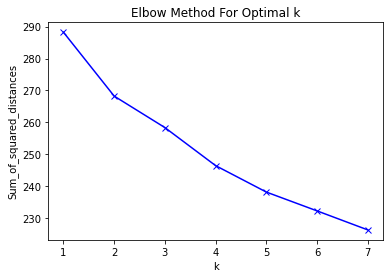

In [211]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

[[1.58100000e+02 6.29136400e+05]
 [1.47960000e+02 3.40928960e+05]
 [1.84294118e+02 4.87447147e+05]
 [2.19600000e+02 7.78525000e+05]]


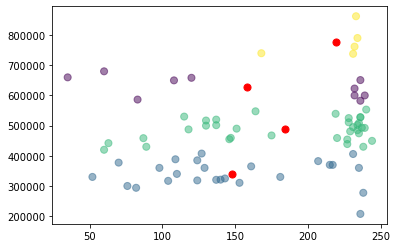

In [217]:
from pandas import DataFrame
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

Data = {'x': df_result['Venue Count'],
        'y': df_result['MedianHomePrice']
       }
  
df = DataFrame(Data,columns=['x','y'])
  
kmeans = KMeans(n_clusters=4).fit(df)
centroids = kmeans.cluster_centers_
print(centroids)

plt.scatter(df['x'], df['y'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.show()

[[112.5         11.44444444]
 [223.44444444 253.22222222]
 [236.5        627.        ]
 [226.2962963   57.33333333]]


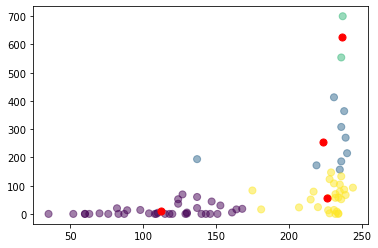

In [218]:
Data = {'x': df_result['Venue Count'],
        'y': df_result['Parking Count']
       }
  
df = DataFrame(Data,columns=['x','y'])
kmeans = KMeans(n_clusters=4).fit(df)
centroids = kmeans.cluster_centers_
print(centroids)

plt.scatter(df['x'], df['y'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.show()

#### Area of Portland that has the greatest potential for improvements

In [54]:
df_good_locations = df_result.loc[(df_result['Route Count'] > 7) & (df_result['Parking Count'] > 4)]

In [55]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_portland = folium.Map(location=[portland_latitude, portland_longitude], zoom_start=13)
folium.Circle([portland_latitude, portland_longitude], radius=2500, color='white', fill=True, fill_opacity=0.6).add_to(map_portland)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_portland) 
map_portland

## Results and Discussion <a name="results"></a>

Consider that the median income for a family in Portland is around 50,000 dollars, which financial advisers
will tell you mean they should not spend more than 315,000 dollars on a house. Also consider that the
national average commuting time is 25 minutes each way. So can you find an affordable house in a
place that’s about a one-hour round-trip commute to downtown Portland by bike?

There are other studies that indicate only 9% of Portland cyclist commuter to work; 53% of Portland
cyclist are engaging in recreational activities. Also, the majority of cyclists are of younger age and
possibility living near universities and schools.

I believe the biggest opportunity for improvement would be around the center of Portland.
It would be my recommendation to have more targeted bicycle routes in the areas where they
connect younger cyclist with essential shopping, work/school and affordable housing. Maybe
develop bicycle routes closer to park and ride locations.


## Conclusion <a name="conclusion"></a>

The purpose of this project was to analyze existing Portland, OR bicycle infrastructure, in order to aid
stakeholders in determining how to encourage commuter to increase bicycle ridership. By calculating
venue density distribution from FourSquare data, median house sale price data, bicycle route and
parking data, we have predicted venue frequencies.

We have concluded that if the stakeholders want to increase bicycle ridership, they should focus
efforts on having high value venues near highly traveled bicycle routes, where affordable house in
close by and obtainable. At the same time, this should cultivate an environment bringing the cyclist a
great sense of pride and community. There are many opportunities to improve the downtown area,
and this would have the biggest impact of achieving the goal of increasing bicycle ridership